# Speech Emotion Recognition | Deep Learning 🦾

**Sayuri Goorun | MSc Notebook | Traditional Modelling**

---

In [ ]:
import numpy as np 
import pandas as pd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff 
import seaborn as sns
import IPython

In [2]:
import tensorflow.keras.layers as L
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# from keras.utils import np_utils
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder,StandardScaler

In [3]:
import re
import itertools
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import os

In [4]:
import xgboost as xgb
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Datasets

In [5]:
Crema_Path = "C:/Users/Yurisha/OneDrive/Desktop/emotion-recognition/CREMA-D Crowd Sourced Emotional Multimodal Actors Dataset/"
Ravdess_Path = "C:/Users/Yurisha/OneDrive/Desktop/emotion-recognition/RAVDESS Ryerson Audio-Visual Database of Emotional Speech and Song/"
Tess_Path = "C:/Users/Yurisha/OneDrive/Desktop/emotion-recognition/TESS Toronto emotional speech set data/"

In [6]:
crema=[]
for wav in os.listdir(Crema_Path):
    emotion=wav.partition(".wav")[0].split('_')
    if emotion[2]=='SAD':
        crema.append(('sad',Crema_Path+'/'+wav))
    elif emotion[2]=='ANG':
        crema.append(('angry',Crema_Path+'/'+wav))
    elif emotion[2]=='DIS':
        crema.append(('disgust',Crema_Path+'/'+wav))
    elif emotion[2]=='FEA':
        crema.append(('fear',Crema_Path+'/'+wav))
    elif emotion[2]=='HAP':
        crema.append(('happy',Crema_Path+'/'+wav))
    elif emotion[2]=='NEU':
        crema.append(('neutral',Crema_Path+'/'+wav))
    else:
        crema.append(('unknown',Crema_Path+'/'+wav))
Crema_df=pd.DataFrame.from_dict(crema)
Crema_df.rename(columns={0:'Emotion',1:'File_Path'},inplace=True)
Crema_df.head()

,Emotion,File_Path
0,angry,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
1,disgust,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2,fear,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
3,happy,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
4,neutral,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...


In [7]:
Crema_df['Emotion'].unique()

array(['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad'],
      dtype=object)

In [8]:
ravdess=[]
for directory in os.listdir(Ravdess_Path):
    actors=os.listdir(os.path.join(Ravdess_Path,directory))
    for wav in actors:
        emotion=wav.partition('.wav')[0].split('-')
        emotion_number=int(emotion[2])
        ravdess.append((emotion_number,os.path.join(Ravdess_Path,directory,wav)))
Ravdess_df=pd.DataFrame.from_dict(ravdess)
Ravdess_df.rename(columns={0:'Emotion',1:'File_Path'},inplace=True)
Ravdess_df['Emotion'].replace({1:'neutral', 2:'neutral', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'},inplace=True)
Ravdess_df.head()

,Emotion,File_Path
0,neutral,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
1,neutral,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2,neutral,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
3,neutral,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
4,neutral,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...


In [9]:
Ravdess_df['Emotion'].unique()

array(['neutral', 'happy', 'sad', 'angry', 'fear', 'disgust', 'surprise'],
      dtype=object)

In [10]:
tess=[]
for directory in os.listdir(Tess_Path):
    for wav in os.listdir(os.path.join(Tess_Path,directory)):
        emotion=wav.partition('.wav')[0].split('_')
        if emotion[2]=='ps':
            tess.append(('surprise',os.path.join(Tess_Path,directory,wav)))
        else:
            tess.append((emotion[2],os.path.join(Tess_Path,directory,wav)))
Tess_df=pd.DataFrame.from_dict(tess)
Tess_df.rename(columns={0:'Emotion',1:'File_Path'},inplace=True)
Tess_df.head()

,Emotion,File_Path
0,angry,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
1,angry,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2,angry,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
3,angry,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
4,angry,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...


In [11]:
Tess_df['Emotion'].unique()

array(['angry', 'disgust', 'fear', 'happy', 'neutral', 'surprise', 'sad'],
      dtype=object)

In [12]:
main_df=pd.concat([Crema_df,Ravdess_df,Tess_df],axis=0)
main_df.shape

(11682, 2)

In [13]:
main_df.head(15)

,Emotion,File_Path
0,angry,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
1,disgust,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2,fear,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
3,happy,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
4,neutral,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
5,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
6,angry,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
7,angry,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
8,angry,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
9,disgust,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...


In [14]:
main_df.tail(15)

,Emotion,File_Path
2785,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2786,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2787,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2788,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2789,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2790,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2791,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2792,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2793,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...
2794,sad,C:/Users/Yurisha/OneDrive/Desktop/emotion-reco...


In [15]:
# colors = {
#     'disgust': '#804E2D',
#     'happy': '#F19C0E',
#     'sad': '#478FB8',
#     'neutral': '#4CB847',
#     'fear': '#7D55AA',
#     'angry': '#C00808',
#     'surprise': '#EE00FF'
# }

colors = {
    'disgust': '#264d73',
    'happy': '#336699',
    'sad': '#538cc6',
    'neutral': '#79a6d2',
    'fear': '#8cb3d9',
    'angry': '#b3cce6',
    'surprise': '#ecf2f9'
}

In [16]:
fig = px.histogram(main_df, x='Emotion', color='Emotion', 
                   color_discrete_map=colors, 
                   title='Emotion Counts')

fig.update_layout(
    xaxis_title=None,
    yaxis_title='Count',
    template='plotly_white', 
    width=1000,
    height=600
)

fig.show()

In [17]:
emotion_names=main_df['Emotion'].unique()

In [18]:
emotion_names

array(['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'],
      dtype=object)

# Data Preprocessing

In [19]:
def wave_plot(data,sr,emotion,color):
    plt.figure(figsize=(12,5))
    plt.title(f'{emotion} emotion for waveplot',size=17)
    librosa.display.waveshow(y=data,sr=sr,color=color)

In [20]:
def spectogram(data,sr,emotion):
    audio=librosa.stft(data)
    audio_db=librosa.amplitude_to_db(abs(audio))
    plt.figure(figsize=(12,5))
    plt.title(f'{emotion} emotion for spectogram',size=17)
    librosa.display.specshow(audio_db,sr=sr,x_axis='time',y_axis='hz')

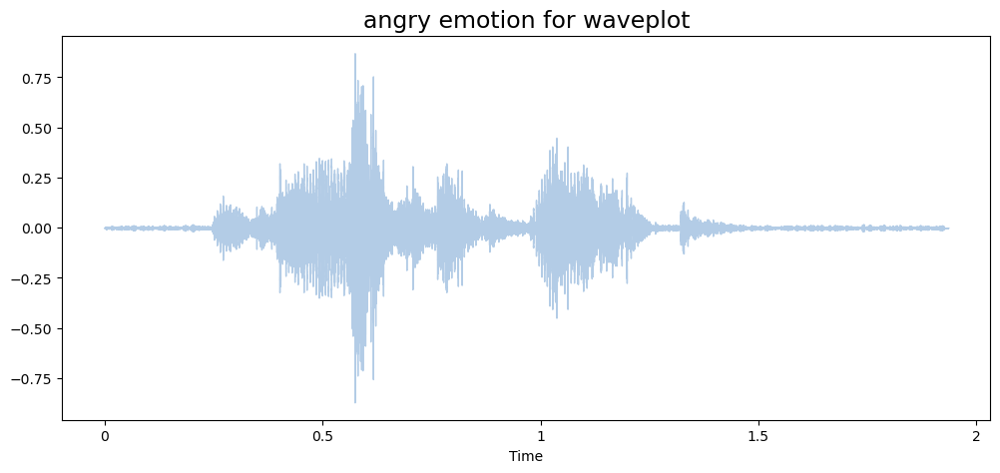

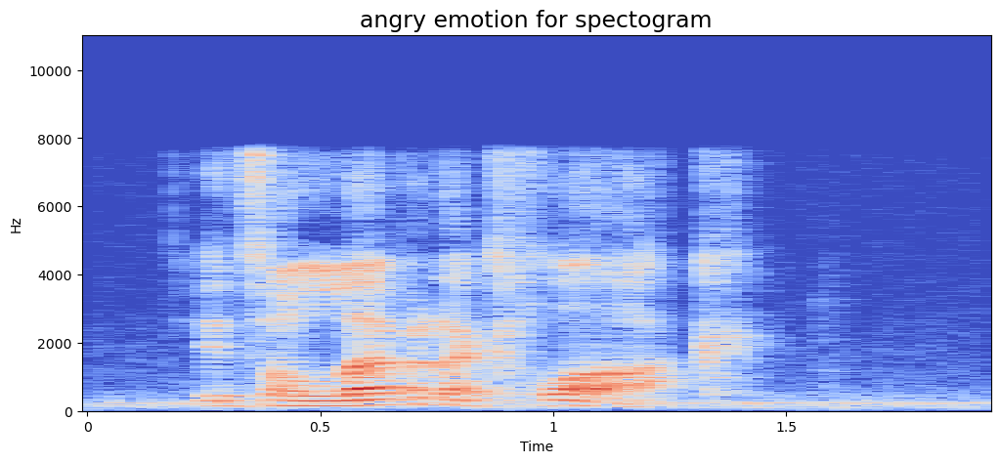

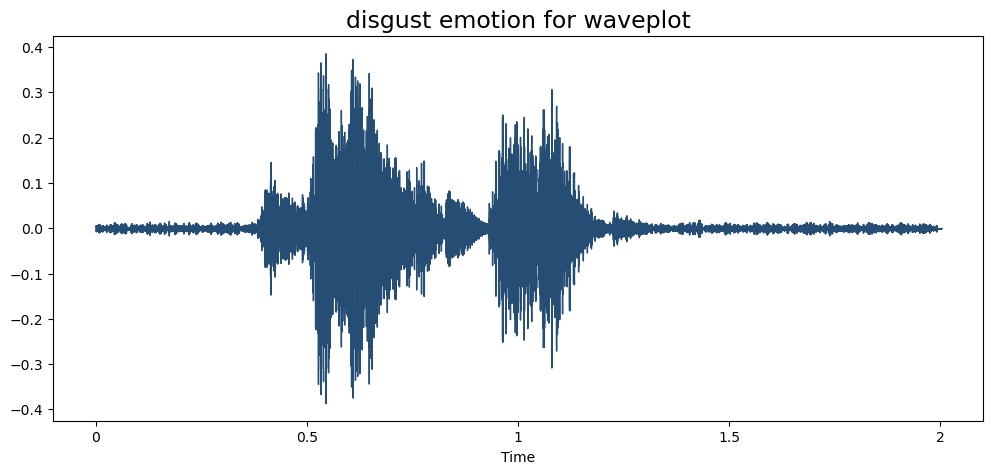

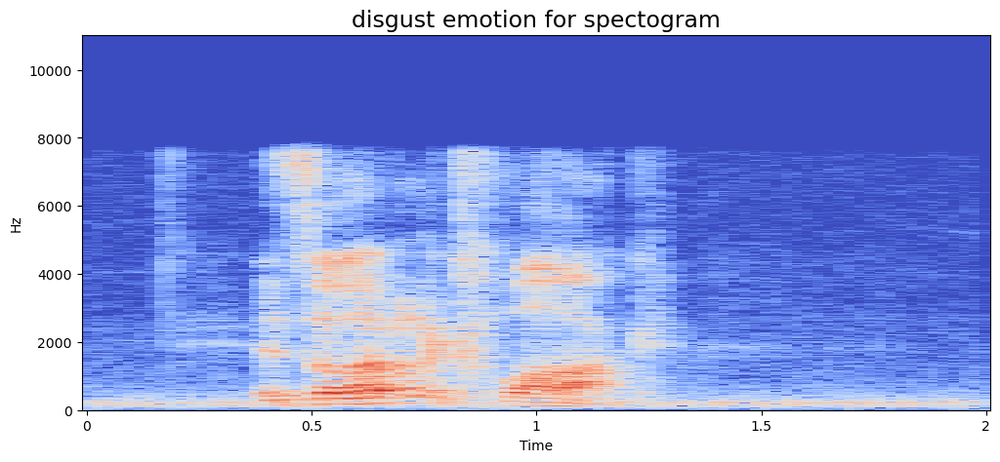

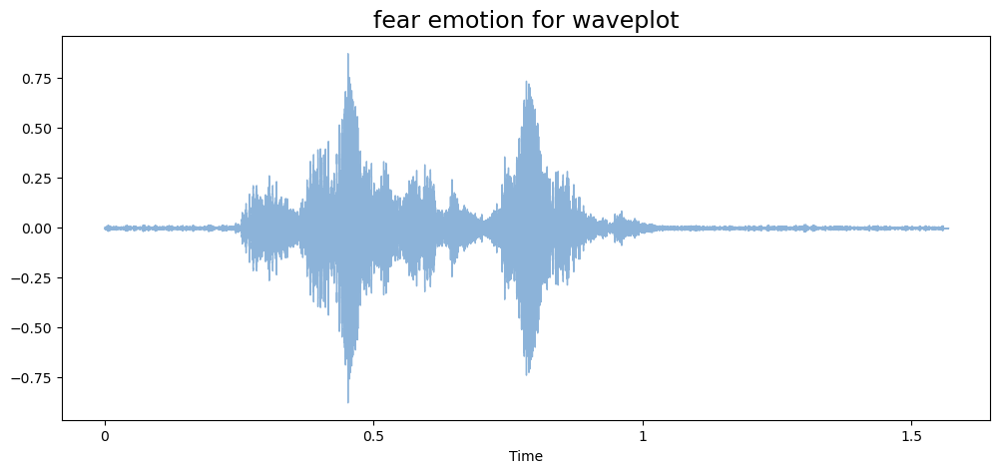

...

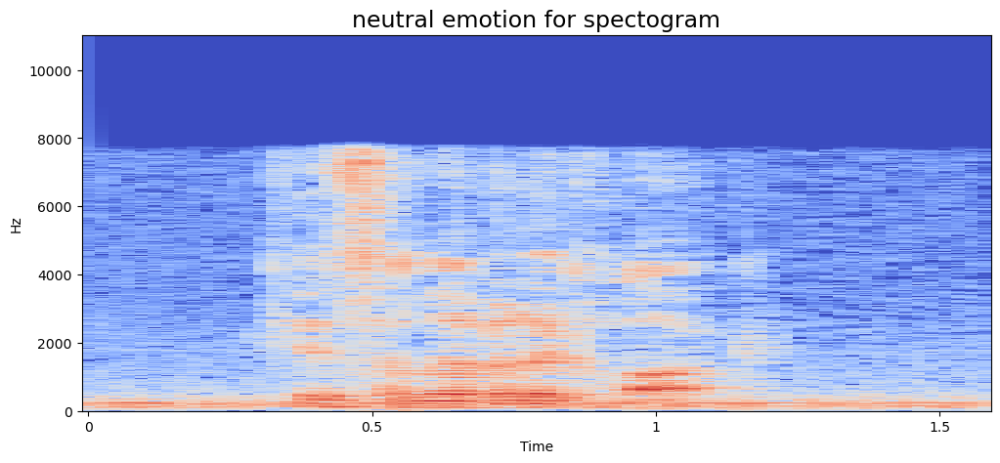

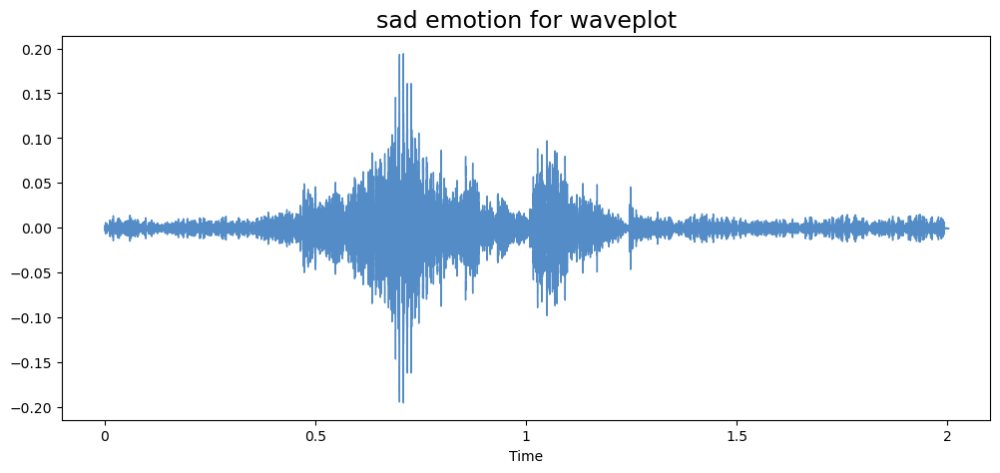

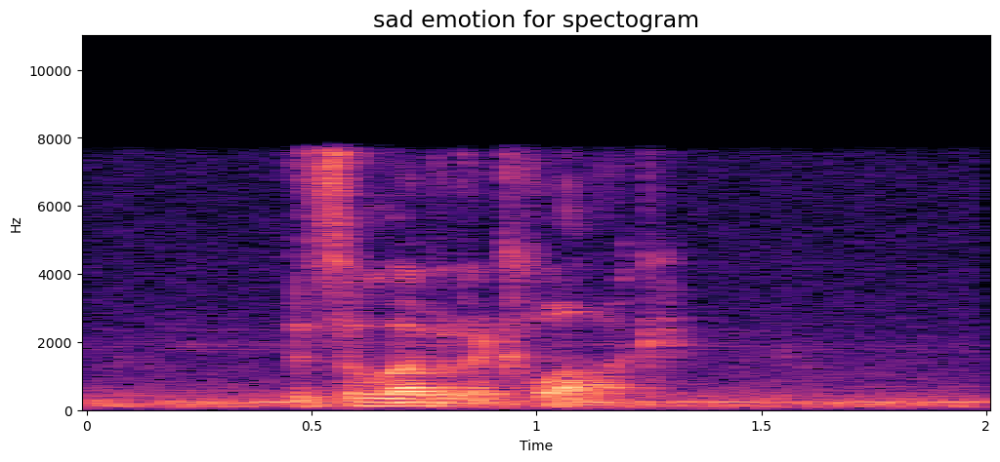

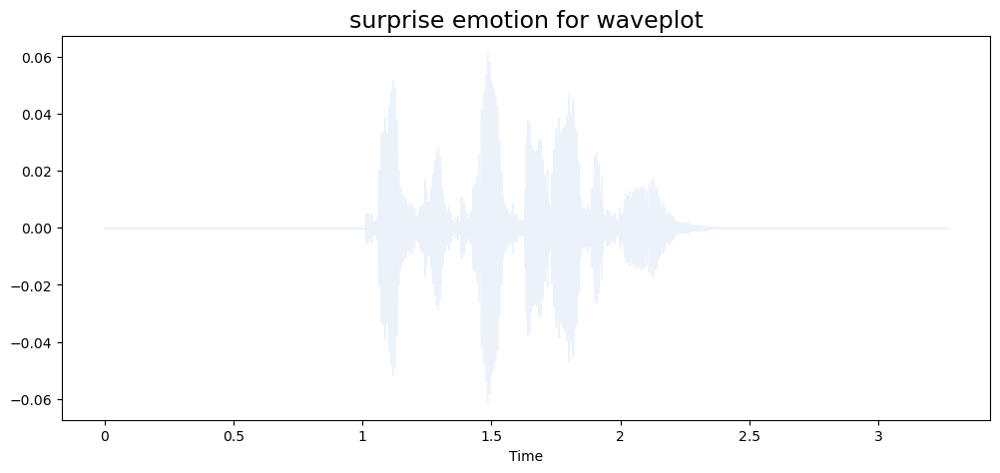

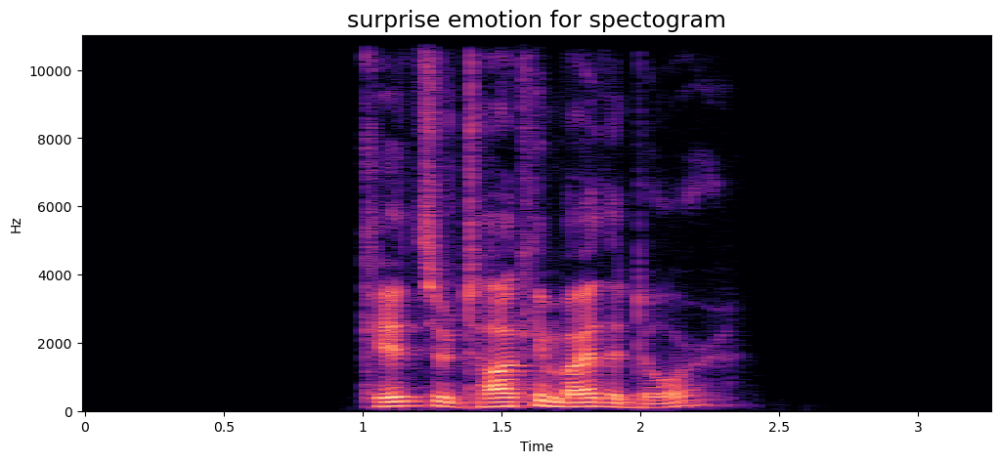

In [21]:
audio_path=[]
for emotion in emotion_names:
    path=np.array(main_df['File_Path'][main_df['Emotion']==emotion])[1]
    data,sr=librosa.load(path)
    wave_plot(data,sr,emotion,colors[emotion])
    spectogram(data,sr,emotion)
    audio_path.append(path)

In [22]:
print('Disgust Audio Sample\n')
IPython.display.Audio(audio_path[0])

Disgust Audio Sample



In [23]:
print('Happy Audio Sample\n')
IPython.display.Audio(audio_path[1])

Happy Audio Sample



In [24]:
print('Sad Audio Sample\n')
IPython.display.Audio(audio_path[2])

Sad Audio Sample



In [25]:
print('Neutral Audio Sample\n')
IPython.display.Audio(audio_path[3])

Neutral Audio Sample



In [26]:
print('Fear Audio Sample\n')
IPython.display.Audio(audio_path[4])

Fear Audio Sample



In [27]:
print('Angry Audio Sample\n')
IPython.display.Audio(audio_path[5])

Angry Audio Sample



In [28]:
print('Surprise Audio Sample\n')
IPython.display.Audio(audio_path[6])

Surprise Audio Sample



# Data Augmentation

In [29]:
def add_noise(data,random=False,rate=0.035,threshold=0.075):
    if random:
        rate=np.random.random()*threshold
    noise=rate*np.random.uniform()*np.amax(data)
    augmented_data=data+noise*np.random.normal(size=data.shape[0])
    return augmented_data

def shifting(data,rate=1000):
    augmented_data=int(np.random.uniform(low=-5,high=5)*rate)
    augmented_data=np.roll(data,augmented_data)
    return augmented_data

def pitching(data, sr, pitch_factor=0.7, random=False):
    if random:
        pitch_factor = np.random.random() * pitch_factor
    return librosa.effects.pitch_shift(data, sr=sr, n_steps=pitch_factor)

def streching(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate=rate)


In [30]:
data,sr=librosa.load(audio_path[6])

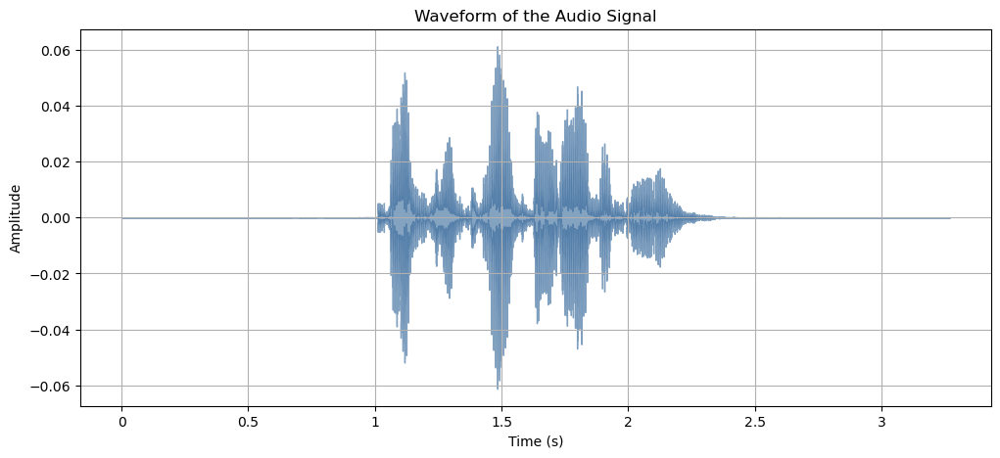

In [31]:
plt.figure(figsize=(12, 5))

librosa.display.waveshow(data, sr=sr, color='#336699', alpha=0.6)

plt.grid(True)

# Adjusting x and y axis labels for clarity
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.title('Waveform of the Audio Signal')

plt.show()

IPython.display.Audio(audio_path[6])

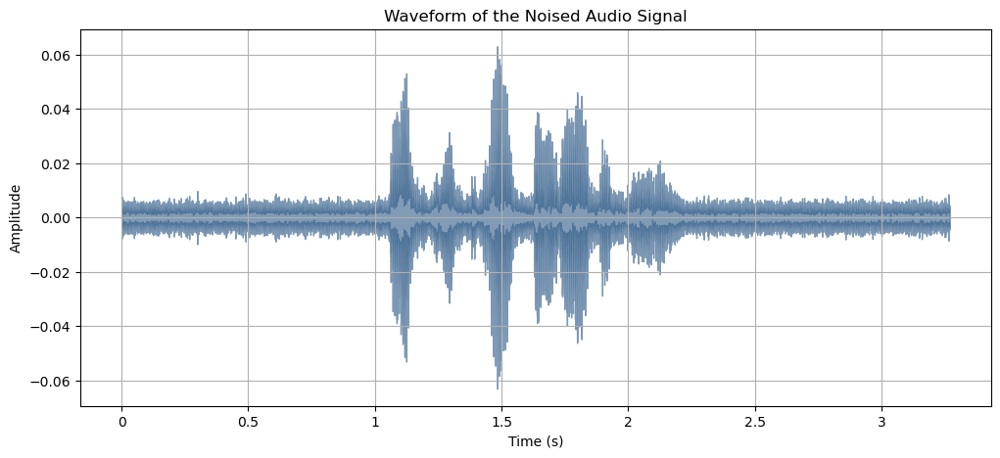

In [32]:
# Apply noise to the audio data
noised_audio = add_noise(data)

plt.figure(figsize=(12, 5))

librosa.display.waveshow(noised_audio, sr=sr, color='#2d5986', alpha=0.6)

plt.grid(True)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.title('Waveform of the Noised Audio Signal')

plt.show()

IPython.display.Audio(noised_audio, rate=sr)

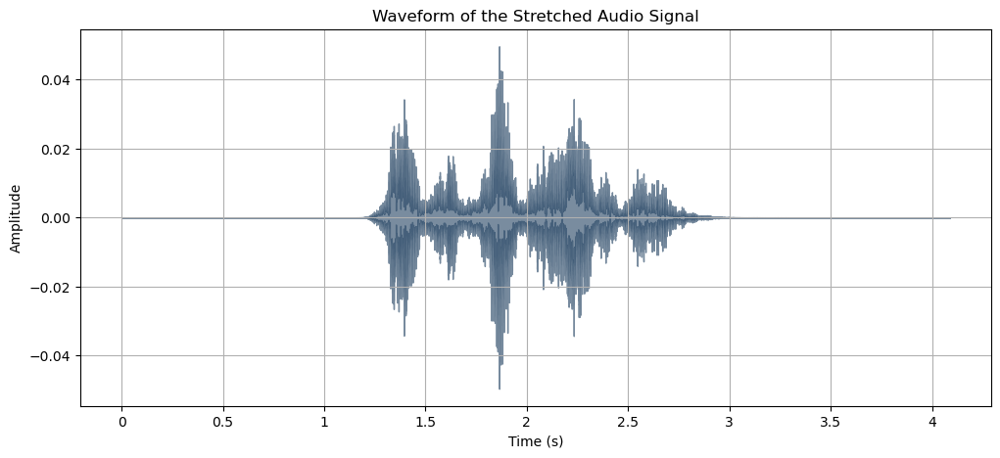

In [33]:
# Apply stretching to the audio data
stretched_audio = streching(data)

plt.figure(figsize=(12, 5))

librosa.display.waveshow(stretched_audio, sr=sr, color='#204060', alpha=0.6)

plt.grid(True)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.title('Waveform of the Stretched Audio Signal')

plt.show()

IPython.display.Audio(stretched_audio, rate=sr)

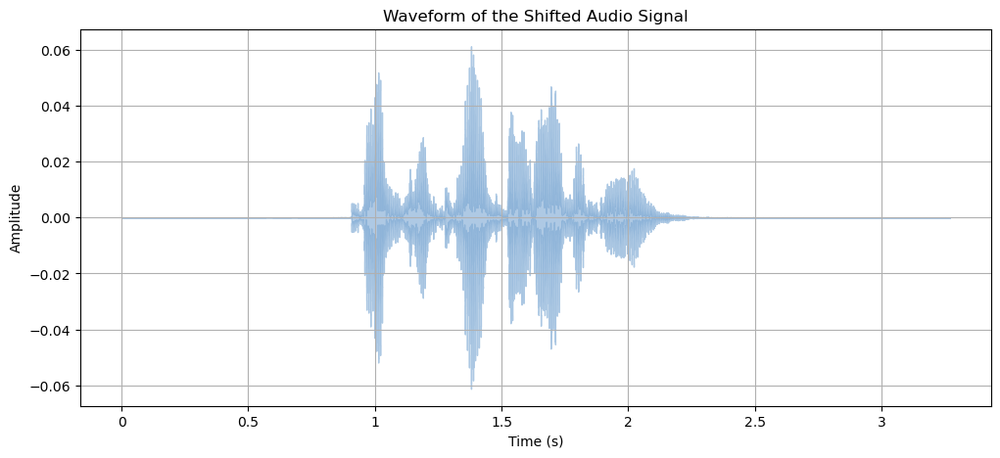

In [34]:
# Apply shifting to the audio data
shifted_audio = shifting(data)

plt.figure(figsize=(12, 5))

librosa.display.waveshow(shifted_audio, sr=sr, color='#79a6d2', alpha=0.6)

plt.grid(True)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.title('Waveform of the Shifted Audio Signal')

plt.show()

IPython.display.Audio(shifted_audio, rate=sr)

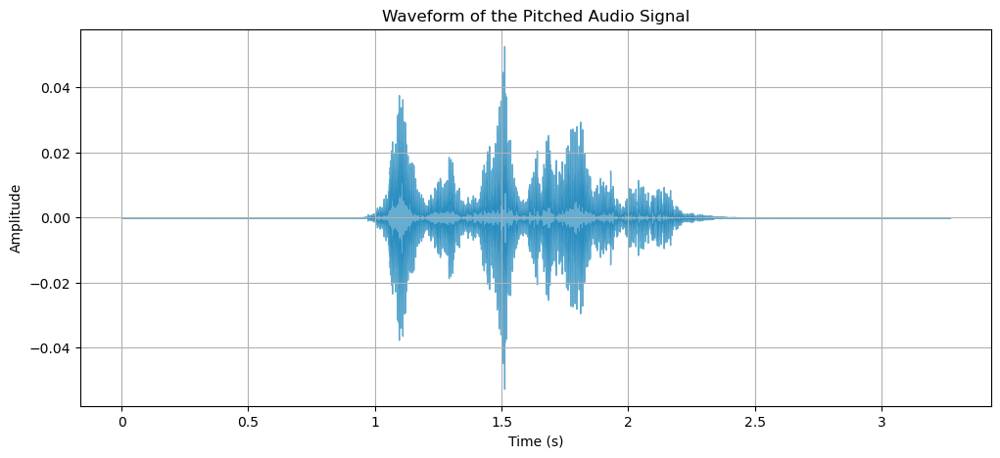

In [35]:
# Apply pitching to the audio data
pitched_audio = pitching(data, sr)

plt.figure(figsize=(12, 5))

librosa.display.waveshow(pitched_audio, sr=sr, color='#0077b3', alpha=0.6)

plt.grid(True)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.title('Waveform of the Pitched Audio Signal')

plt.show()

IPython.display.Audio(pitched_audio, rate=sr)

# Feature Extraction

In [36]:
def zcr(data,frame_length,hop_length):
    zcr=librosa.feature.zero_crossing_rate(data,frame_length=frame_length,hop_length=hop_length)
    return np.squeeze(zcr)

# def rmse(data,frame_length=2048,hop_length=512):
#     rmse=librosa.feature.rms(data,frame_length=frame_length,hop_length=hop_length)
#     return np.squeeze(rmse)


def rmse(data, frame_length=2048, hop_length=512):
    rmse = librosa.feature.rms(y=data, frame_length=frame_length, hop_length=hop_length)
    return np.squeeze(rmse)


# def mfcc(data,sr,frame_length=2048,hop_length=512,flatten:bool=True):
#     mfcc=librosa.feature.mfcc(data,sr=sr)
#     return np.squeeze(mfcc.T)if not flatten else np.ravel(mfcc.T)

def mfcc(data, sr, frame_length=2048, hop_length=512, flatten: bool = True):
    mfcc = librosa.feature.mfcc(y=data, sr=sr, n_mfcc=13, hop_length=hop_length, n_fft=frame_length)
    return np.squeeze(mfcc.T) if not flatten else np.ravel(mfcc.T)



def extract_features(data,sr,frame_length=2048,hop_length=512):
    result=np.array([])
    
    result=np.hstack((result,
                      zcr(data,frame_length,hop_length),
                      rmse(data,frame_length,hop_length),
                      mfcc(data,sr,frame_length,hop_length)
                     ))
    return result

def get_features(path,duration=2.5, offset=0.6):
    data,sr=librosa.load(path,duration=duration,offset=offset)
    aud=extract_features(data,sr)
    audio=np.array(aud)
    
    noised_audio=add_noise(data,random=True)
    aud2=extract_features(noised_audio,sr)
    audio=np.vstack((audio,aud2))
    
    pitched_audio=pitching(data,sr,random=True)
    aud3=extract_features(pitched_audio,sr)
    audio=np.vstack((audio,aud3))
    
    pitched_audio1=pitching(data,sr,random=True)
    pitched_noised_audio=add_noise(pitched_audio1,random=True)
    aud4=extract_features(pitched_noised_audio,sr)
    audio=np.vstack((audio,aud4))
    
    return audio

In [37]:
X,Y=[],[]
for path,emotion,index in zip(main_df.File_Path,main_df.Emotion,range(main_df.File_Path.shape[0])):
    features=get_features(path)
    if index%500==0:
        print(f'{index} audio has been processed')
    for i in features:
        X.append(i)
        Y.append(emotion)
print('Done')

0 audio has been processed
500 audio has been processed
1000 audio has been processed
1500 audio has been processed
2000 audio has been processed
2500 audio has been processed
3000 audio has been processed
3500 audio has been processed
4000 audio has been processed
4500 audio has been processed
5000 audio has been processed
5500 audio has been processed
6000 audio has been processed
6500 audio has been processed
7000 audio has been processed
7500 audio has been processed
8000 audio has been processed
8500 audio has been processed
9000 audio has been processed
9500 audio has been processed
10000 audio has been processed
10500 audio has been processed
11000 audio has been processed
11500 audio has been processed
Done


In [38]:
processed_data_path = 'C:\\Users\\Yurisha\\OneDrive\\Desktop\\emotion-recognition\\processed_data3.csv'

In [39]:
processed_data_path

'C:\\Users\\Yurisha\\OneDrive\\Desktop\\emotion-recognition\\processed_data3.csv'

In [40]:
extract=pd.DataFrame(X)
extract['Emotion']=Y
extract.to_csv(processed_data_path,index=False)
extract.head(10)

,0,1,2,3,4,5,6,7,8,9,...,1611,1612,1613,1614,1615,1616,1617,1618,1619,Emotion
0,0.034180,0.069336,0.115723,0.148926,0.142090,0.130859,0.101562,0.070801,0.069336,0.074219,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,angry
1,0.154297,0.258789,0.362793,0.389648,0.328613,0.261719,0.195312,0.160645,0.207031,0.218750,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,angry
2,0.039062,0.083008,0.130371,0.144531,0.137207,0.116211,0.084961,0.074707,0.067383,0.068848,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,angry
3,0.103516,0.192383,0.265137,0.270020,0.231934,0.172852,0.129883,0.120605,0.120117,0.124512,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,angry
4,0.041504,0.059082,0.070312,0.062988,0.080566,0.128906,0.145508,0.146484,0.125977,0.072266,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,disgust
5,0.041504,0.059082,0.070312,0.062012,0.083496,0.130859,0.152344,0.155273,0.130859,0.079102,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,disgust
6,0.040527,0.056641,0.069824,0.065430,0.087891,0.117188,0.130371,0.129395,0.105957,0.076172,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,disgust
7,0.040527,0.056641,0.068848,0.065430,0.087402,0.114258,0.130371,0.128418,0.106934,0.078125,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,disgust
8,0.052734,0.069336,0.087402,0.068848,0.076660,0.075684,0.077637,0.078613,0.072266,0.084961,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fear
9,0.064453,0.083984,0.118652,0.105469,0.138184,0.148926,0.144043,0.135254,0.113770,0.119141,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fear


In [41]:
df=pd.read_csv(processed_data_path)

In [42]:
df.head(3)

,0,1,2,3,4,5,6,7,8,9,...,1611,1612,1613,1614,1615,1616,1617,1618,1619,Emotion
0,0.034180,0.069336,0.115723,0.148926,0.142090,0.130859,0.101562,0.070801,0.069336,0.074219,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,angry
1,0.154297,0.258789,0.362793,0.389648,0.328613,0.261719,0.195312,0.160645,0.207031,0.218750,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,angry
2,0.039062,0.083008,0.130371,0.144531,0.137207,0.116211,0.084961,0.074707,0.067383,0.068848,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,angry


In [43]:
df=df.fillna(0)

In [44]:
print(df.isna().any())
df.shape

0          False
1          False
2          False
3          False
4          False
           ...  
1616       False
1617       False
1618       False
1619       False
Emotion    False
Length: 1621, dtype: bool


(46728, 1621)

In [45]:
df.head(10)

,0,1,2,3,4,5,6,7,8,9,...,1611,1612,1613,1614,1615,1616,1617,1618,1619,Emotion
0,0.034180,0.069336,0.115723,0.148926,0.142090,0.130859,0.101562,0.070801,0.069336,0.074219,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,angry
1,0.154297,0.258789,0.362793,0.389648,0.328613,0.261719,0.195312,0.160645,0.207031,0.218750,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,angry
2,0.039062,0.083008,0.130371,0.144531,0.137207,0.116211,0.084961,0.074707,0.067383,0.068848,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,angry
3,0.103516,0.192383,0.265137,0.270020,0.231934,0.172852,0.129883,0.120605,0.120117,0.124512,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,angry
4,0.041504,0.059082,0.070312,0.062988,0.080566,0.128906,0.145508,0.146484,0.125977,0.072266,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,disgust
5,0.041504,0.059082,0.070312,0.062012,0.083496,0.130859,0.152344,0.155273,0.130859,0.079102,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,disgust
6,0.040527,0.056641,0.069824,0.065430,0.087891,0.117188,0.130371,0.129395,0.105957,0.076172,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,disgust
7,0.040527,0.056641,0.068848,0.065430,0.087402,0.114258,0.130371,0.128418,0.106934,0.078125,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,disgust
8,0.052734,0.069336,0.087402,0.068848,0.076660,0.075684,0.077637,0.078613,0.072266,0.084961,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fear
9,0.064453,0.083984,0.118652,0.105469,0.138184,0.148926,0.144043,0.135254,0.113770,0.119141,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,fear


In [46]:
X=df.drop(labels='Emotion',axis=1)
Y=df['Emotion']

In [47]:
X.head()

,0,1,2,3,4,5,6,7,8,9,...,1610,1611,1612,1613,1614,1615,1616,1617,1618,1619
0,0.034180,0.069336,0.115723,0.148926,0.142090,0.130859,0.101562,0.070801,0.069336,0.074219,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.154297,0.258789,0.362793,0.389648,0.328613,0.261719,0.195312,0.160645,0.207031,0.218750,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.039062,0.083008,0.130371,0.144531,0.137207,0.116211,0.084961,0.074707,0.067383,0.068848,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.103516,0.192383,0.265137,0.270020,0.231934,0.172852,0.129883,0.120605,0.120117,0.124512,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.041504,0.059082,0.070312,0.062988,0.080566,0.128906,0.145508,0.146484,0.125977,0.072266,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [48]:
Y

0          angry
1          angry
2          angry
3          angry
4        disgust
          ...   
46723        sad
46724        sad
46725        sad
46726        sad
46727        sad
Name: Emotion, Length: 46728, dtype: object

# Data Split

In [49]:
lb = LabelEncoder()
Y = lb.fit_transform(Y)  # Encode emotions into integers
Y = to_categorical(Y)

**Explanation for 2 step splits:**

To ensure robust model training and evaluation:

Test Set Isolation: The first split separates 20% of the data as an independent test set so there is an unbiased evaluation of the model's generalization performance on unseen data.

Training and Validation Split: The second split divides the remaining 80% into 72% training and 18% validation data. It provides sufficient data for training deep learning models.

The final dataset split based on the provided code below is:

Training Set: 72% of the total data. <br>
Validation Set: 18% of the total data. <br>
Test Set: 10% of the total data.

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [51]:
# Feature scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_val = scaler.transform(X_val)

---

# XGBOOST

In [52]:
# Convert the data to DMatrix, which is the data structure that XGB uses
dtrain = xgb.DMatrix(X_train, label=np.argmax(y_train, axis=1))
dtest = xgb.DMatrix(X_test, label=np.argmax(y_test, axis=1))

In [53]:
params = {
    'objective': 'multi:softprob',
    'num_class': Y.shape[1],
    'max_depth': 6,
    'learning_rate': 0.1,
    'eval_metric': 'mlogloss'
}

In [54]:
# Train the XGBoost model
xgb_model = xgb.train(params, dtrain, num_boost_round=100, evals=[(dtest, 'test')], early_stopping_rounds=10)

[0]	test-mlogloss:1.89062
[1]	test-mlogloss:1.84274
[2]	test-mlogloss:1.80123
[3]	test-mlogloss:1.76343
[4]	test-mlogloss:1.72819
[5]	test-mlogloss:1.69661
[6]	test-mlogloss:1.66643
[7]	test-mlogloss:1.64021
[8]	test-mlogloss:1.61562
[9]	test-mlogloss:1.59272
[10]	test-mlogloss:1.57118
[11]	test-mlogloss:1.55142
[12]	test-mlogloss:1.53352
[13]	test-mlogloss:1.51599
[14]	test-mlogloss:1.49956
[15]	test-mlogloss:1.48387
[16]	test-mlogloss:1.46862
[17]	test-mlogloss:1.45514
[18]	test-mlogloss:1.44141
[19]	test-mlogloss:1.42921
[20]	test-mlogloss:1.41635
[21]	test-mlogloss:1.40400
[22]	test-mlogloss:1.39144
[23]	test-mlogloss:1.37971
[24]	test-mlogloss:1.36926
[25]	test-mlogloss:1.35856
[26]	test-mlogloss:1.34812
[27]	test-mlogloss:1.33878
[28]	test-mlogloss:1.32883
[29]	test-mlogloss:1.32013
[30]	test-mlogloss:1.31176
[31]	test-mlogloss:1.30323
[32]	test-mlogloss:1.29558
[33]	test-mlogloss:1.28827
[34]	test-mlogloss:1.28166
[35]	test-mlogloss:1.27385
[36]	test-mlogloss:1.26684
[37]	test-m

In [55]:
y_pred_prob_xgb = xgb_model.predict(dtest)  # This gives you the probabilities

In [56]:
y_pred_xgb = y_pred_prob_xgb.argmax(axis=1)

In [57]:
# Evaluate accuracy
accuracy_xgb = accuracy_score(np.argmax(y_test, axis=1), y_pred_xgb)
print(f'XGBoost Test Accuracy: {accuracy_xgb:.4f}')

XGBoost Test Accuracy: 0.6530


> **Scores TTV**

In [59]:
from sklearn.metrics import accuracy_score

# Predictions for training and validation sets
dtrain_full = xgb.DMatrix(X_train)
dval = xgb.DMatrix(X_val)

y_pred_train_xgb = xgb_model.predict(dtrain_full).argmax(axis=1)
y_pred_val_xgb = xgb_model.predict(dval).argmax(axis=1)

# Accuracy scores
train_accuracy_xgb = accuracy_score(np.argmax(y_train, axis=1), y_pred_train_xgb)
val_accuracy_xgb = accuracy_score(np.argmax(y_val, axis=1), y_pred_val_xgb)
test_accuracy_xgb = accuracy_score(np.argmax(y_test, axis=1), y_pred_xgb)

print(f'XGBoost Train Accuracy: {train_accuracy_xgb:.4f}')
print(f'XGBoost Validation Accuracy: {val_accuracy_xgb:.4f}')
print(f'XGBoost Test Accuracy: {test_accuracy_xgb:.4f}')

XGBoost Train Accuracy: 0.8676
XGBoost Validation Accuracy: 0.6601
XGBoost Test Accuracy: 0.6530


> **Classification Report**

In [60]:
from sklearn.metrics import classification_report

# Classification report
report_xgb = classification_report(np.argmax(y_test, axis=1), y_pred_xgb, target_names=lb.classes_)
print(report_xgb)

              precision    recall  f1-score   support

       angry       0.71      0.76      0.74      1508
     disgust       0.63      0.63      0.63      1526
        fear       0.66      0.48      0.55      1414
       happy       0.59      0.61      0.60      1449
     neutral       0.63      0.69      0.66      1470
         sad       0.64      0.71      0.67      1495
    surprise       0.87      0.74      0.80       484

    accuracy                           0.65      9346
   macro avg       0.68      0.66      0.66      9346
weighted avg       0.66      0.65      0.65      9346



> **Act vs. predicted counts**

In [63]:
import plotly.graph_objs as go

# Calculate the actual and predicted counts for each emotion
actual_counts_xgb = np.bincount(np.argmax(y_test, axis=1), minlength=len(lb.classes_))
predicted_counts_xgb = np.bincount(y_pred_xgb, minlength=len(lb.classes_))

emotion_counts_df_xgb = pd.DataFrame({
    'Emotion': lb.classes_,
    'Actual': actual_counts_xgb,
    'Predicted': predicted_counts_xgb
})

trace_actual_xgb = go.Bar(
    x=emotion_counts_df_xgb['Emotion'],
    y=emotion_counts_df_xgb['Actual'],
    name='Actual',
    marker=dict(color='lightblue')
)

trace_predicted_xgb = go.Bar(
    x=emotion_counts_df_xgb['Emotion'],
    y=emotion_counts_df_xgb['Predicted'],
    name='Predicted',
    marker=dict(color='darkblue')
)

layout_xgb = go.Layout(
    title='XGBoost: Actual vs Predicted Emotion Counts',
    xaxis=dict(title='Emotion'),
    yaxis=dict(title='Count'),
    barmode='group'
)

fig_xgb = go.Figure(data=[trace_actual_xgb, trace_predicted_xgb], layout=layout_xgb)

# Show the plot
fig_xgb.show()

> **Confusion Matrix**

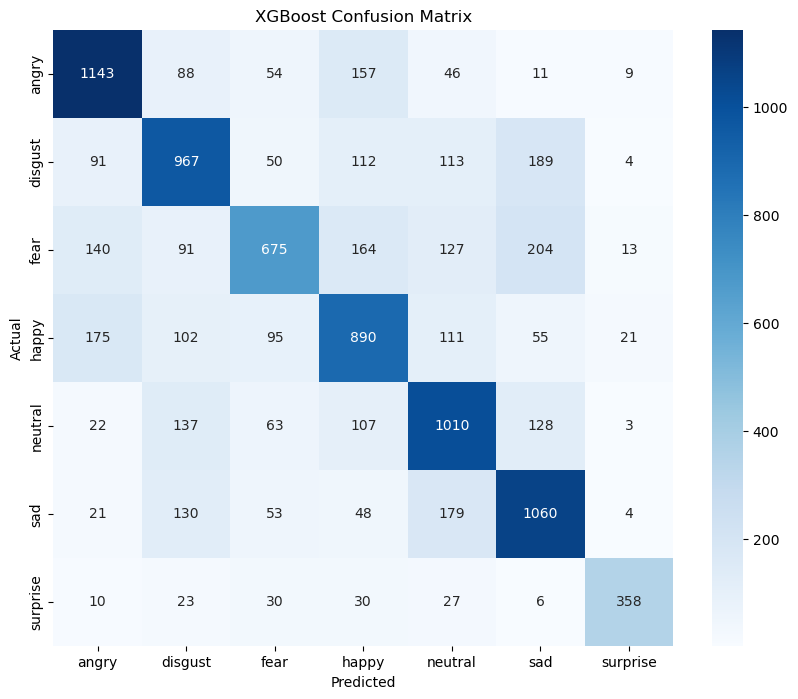

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Confusion matrix
cm_xgb = confusion_matrix(np.argmax(y_test, axis=1), y_pred_xgb)

cm_df_xgb = pd.DataFrame(cm_xgb, index=lb.classes_, columns=lb.classes_)

plt.figure(figsize=(10, 8))
sns.heatmap(cm_df_xgb, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('XGBoost Confusion Matrix')
plt.show()

> **AUC ROC**

In [65]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

y_test_binarized = label_binarize(np.argmax(y_test, axis=1), classes=range(len(lb.classes_)))

fpr_xgb = dict()
tpr_xgb = dict()
roc_auc_xgb = dict()
n_classes = len(lb.classes_)

for i in range(n_classes):
    fpr_xgb[i], tpr_xgb[i], _ = roc_curve(y_test_binarized[:, i], y_pred_prob_xgb[:, i])
    roc_auc_xgb[i] = auc(fpr_xgb[i], tpr_xgb[i])

roc_traces_xgb = []
for i in range(n_classes):
    trace = go.Scatter(
        x=fpr_xgb[i],
        y=tpr_xgb[i],
        mode='lines',
        name=f'{lb.classes_[i]} (AUC = {roc_auc_xgb[i]:.2f})',
        line=dict(width=2)
    )
    roc_traces_xgb.append(trace)

trace_diagonal_xgb = go.Scatter(
    x=[0, 1],
    y=[0, 1],
    mode='lines',
    name='Random Classifier',
    line=dict(color='black', dash='dash')
)

layout_roc_xgb = go.Layout(
    title='XGBoost: ROC Curves for Multiclass Classification',
    xaxis=dict(title='False Positive Rate'),
    yaxis=dict(title='True Positive Rate'),
    showlegend=True,
    legend=dict(
        x=0.95,
        y=0.05,
        xanchor='right',
        yanchor='bottom',
        bgcolor='rgba(255, 255, 255, 0.5)'
    ),
    width=800,
    height=600
)

fig_roc_xgb = go.Figure(data=roc_traces_xgb + [trace_diagonal_xgb], layout=layout_roc_xgb)

fig_roc_xgb.show()

---

# SVM

In [66]:
# Initialize the SVM model
svm_model = SVC(kernel='linear', probability=True, random_state=42)

In [67]:
# Train the SVM model
svm_model.fit(X_train, np.argmax(y_train, axis=1)) #07:40 - 13:05

SVC(kernel='linear', probability=True, random_state=42)

> **Scores**

In [79]:
from sklearn.metrics import accuracy_score

# Predict on the training and validation sets
y_pred_train_svm = svm_model.predict(X_train)
y_pred_val_svm = svm_model.predict(X_val)

In [80]:
# Accuracy scores
train_accuracy_svm = accuracy_score(np.argmax(y_train, axis=1), y_pred_train_svm)
val_accuracy_svm = accuracy_score(np.argmax(y_val, axis=1), y_pred_val_svm)
test_accuracy_svm = accuracy_score(np.argmax(y_test, axis=1), y_pred_svm)

In [81]:
print(f'SVM Train Accuracy: {train_accuracy_svm:.4f}')
print(f'SVM Validation Accuracy: {val_accuracy_svm:.4f}')
print(f'SVM Test Accuracy: {test_accuracy_svm:.4f}')

SVM Train Accuracy: 0.6409
SVM Validation Accuracy: 0.4993
SVM Test Accuracy: 0.4871


> **Classification Report**

In [82]:
# Classification report
report_svm = classification_report(np.argmax(y_test, axis=1), y_pred_svm, target_names=lb.classes_)
print(report_svm)

              precision    recall  f1-score   support

       angry       0.52      0.58      0.55      1508
     disgust       0.48      0.50      0.49      1526
        fear       0.41      0.42      0.41      1414
       happy       0.43      0.46      0.45      1449
     neutral       0.49      0.41      0.45      1470
         sad       0.52      0.49      0.51      1495
    surprise       0.71      0.61      0.65       484

    accuracy                           0.49      9346
   macro avg       0.51      0.50      0.50      9346
weighted avg       0.49      0.49      0.49      9346



> **Actual vs. Predicted Counts**

In [83]:
import plotly.graph_objs as go

actual_counts_svm = np.bincount(np.argmax(y_test, axis=1), minlength=len(lb.classes_))
predicted_counts_svm = np.bincount(y_pred_svm, minlength=len(lb.classes_))

emotion_counts_df_svm = pd.DataFrame({
    'Emotion': lb.classes_,
    'Actual': actual_counts_svm,
    'Predicted': predicted_counts_svm
})

trace_actual_svm = go.Bar(
    x=emotion_counts_df_svm['Emotion'],
    y=emotion_counts_df_svm['Actual'],
    name='Actual',
    marker=dict(color='lightblue')
)

trace_predicted_svm = go.Bar(
    x=emotion_counts_df_svm['Emotion'],
    y=emotion_counts_df_svm['Predicted'],
    name='Predicted',
    marker=dict(color='darkblue')
)

layout_svm = go.Layout(
    title='SVM: Actual vs Predicted Emotion Counts',
    xaxis=dict(title='Emotion'),
    yaxis=dict(title='Count'),
    barmode='group'
)

fig_svm = go.Figure(data=[trace_actual_svm, trace_predicted_svm], layout=layout_svm)

fig_svm.show()

> **Confusion Matrix**

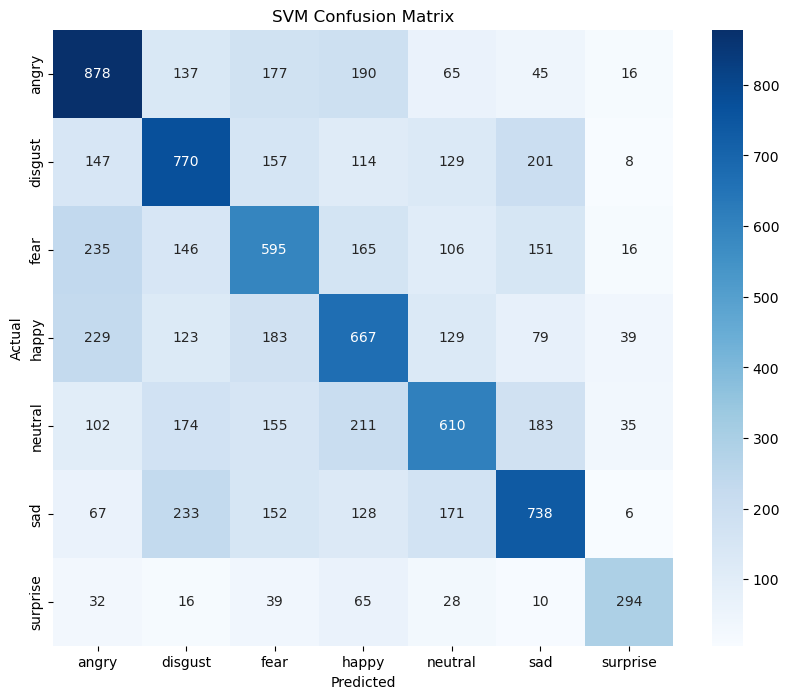

In [84]:
cm_svm = confusion_matrix(np.argmax(y_test, axis=1), y_pred_svm)

cm_df_svm = pd.DataFrame(cm_svm, index=lb.classes_, columns=lb.classes_)

# Plotting the confusion matrix using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cm_df_svm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('SVM Confusion Matrix')
plt.show()


> **AUC ROC**

In [85]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

y_pred_prob_svm = svm_model.predict_proba(X_test)

y_test_binarized = label_binarize(np.argmax(y_test, axis=1), classes=range(len(lb.classes_)))

fpr_svm = dict()
tpr_svm = dict()
roc_auc_svm = dict()
n_classes = len(lb.classes_)

for i in range(n_classes):
    fpr_svm[i], tpr_svm[i], _ = roc_curve(y_test_binarized[:, i], y_pred_prob_svm[:, i])
    roc_auc_svm[i] = auc(fpr_svm[i], tpr_svm[i])

roc_traces_svm = []
for i in range(n_classes):
    trace = go.Scatter(
        x=fpr_svm[i],
        y=tpr_svm[i],
        mode='lines',
        name=f'{lb.classes_[i]} (AUC = {roc_auc_svm[i]:.2f})',
        line=dict(width=2)
    )
    roc_traces_svm.append(trace)

trace_diagonal_svm = go.Scatter(
    x=[0, 1],
    y=[0, 1],
    mode='lines',
    name='Random Classifier',
    line=dict(color='black', dash='dash')
)

layout_roc_svm = go.Layout(
    title='SVM: ROC Curves for Multiclass Classification',
    xaxis=dict(title='False Positive Rate'),
    yaxis=dict(title='True Positive Rate'),
    showlegend=True,
    legend=dict(
        x=0.95,
        y=0.05,
        xanchor='right',
        yanchor='bottom',
        bgcolor='rgba(255, 255, 255, 0.5)'
    ),
    width=800,
    height=600
)

fig_roc_svm = go.Figure(data=roc_traces_svm + [trace_diagonal_svm], layout=layout_roc_svm)

fig_roc_svm.show()

---

# RANDOM FOREST

In [86]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
import seaborn as sns

In [87]:
# Initialize the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

In [88]:
# Train the Random Forest model
rf_model.fit(X_train, np.argmax(y_train, axis=1)) #10:20

RandomForestClassifier(random_state=42)

In [89]:
# Predict on the test set
y_pred_rf = rf_model.predict(X_test)

> **Scores**

In [90]:
y_pred_train_rf = rf_model.predict(X_train)
y_pred_val_rf = rf_model.predict(X_val)

In [91]:
# Accuracy scores
train_accuracy_rf = accuracy_score(np.argmax(y_train, axis=1), y_pred_train_rf)
val_accuracy_rf = accuracy_score(np.argmax(y_val, axis=1), y_pred_val_rf)
test_accuracy_rf = accuracy_score(np.argmax(y_test, axis=1), y_pred_rf)

print(f'Random Forest Train Accuracy: {train_accuracy_rf:.4f}')
print(f'Random Forest Validation Accuracy: {val_accuracy_rf:.4f}')
print(f'Random Forest Test Accuracy: {test_accuracy_rf:.4f}')

Random Forest Train Accuracy: 1.0000
Random Forest Validation Accuracy: 0.7828
Random Forest Test Accuracy: 0.7789


> **Classification Reports**

In [92]:
report_rf = classification_report(np.argmax(y_test, axis=1), y_pred_rf, target_names=lb.classes_)
print(report_rf)

              precision    recall  f1-score   support

       angry       0.79      0.89      0.84      1508
     disgust       0.72      0.77      0.74      1526
        fear       0.86      0.68      0.76      1414
       happy       0.78      0.76      0.77      1449
     neutral       0.76      0.77      0.77      1470
         sad       0.74      0.80      0.77      1495
    surprise       0.94      0.79      0.86       484

    accuracy                           0.78      9346
   macro avg       0.80      0.78      0.79      9346
weighted avg       0.78      0.78      0.78      9346



> **Actual vs. Predicted**

In [93]:
import plotly.graph_objs as go

actual_counts_rf = np.bincount(np.argmax(y_test, axis=1), minlength=len(lb.classes_))
predicted_counts_rf = np.bincount(y_pred_rf, minlength=len(lb.classes_))

emotion_counts_df_rf = pd.DataFrame({
    'Emotion': lb.classes_,
    'Actual': actual_counts_rf,
    'Predicted': predicted_counts_rf
})

trace_actual_rf = go.Bar(
    x=emotion_counts_df_rf['Emotion'],
    y=emotion_counts_df_rf['Actual'],
    name='Actual',
    marker=dict(color='lightblue')
)

trace_predicted_rf = go.Bar(
    x=emotion_counts_df_rf['Emotion'],
    y=emotion_counts_df_rf['Predicted'],
    name='Predicted',
    marker=dict(color='darkblue')
)

layout_rf = go.Layout(
    title='Random Forest: Actual vs Predicted Emotion Counts',
    xaxis=dict(title='Emotion'),
    yaxis=dict(title='Count'),
    barmode='group'
)

# Create the figure and add the traces
fig_rf = go.Figure(data=[trace_actual_rf, trace_predicted_rf], layout=layout_rf)

# Show the plot
fig_rf.show()

> **Confusion Matrix**

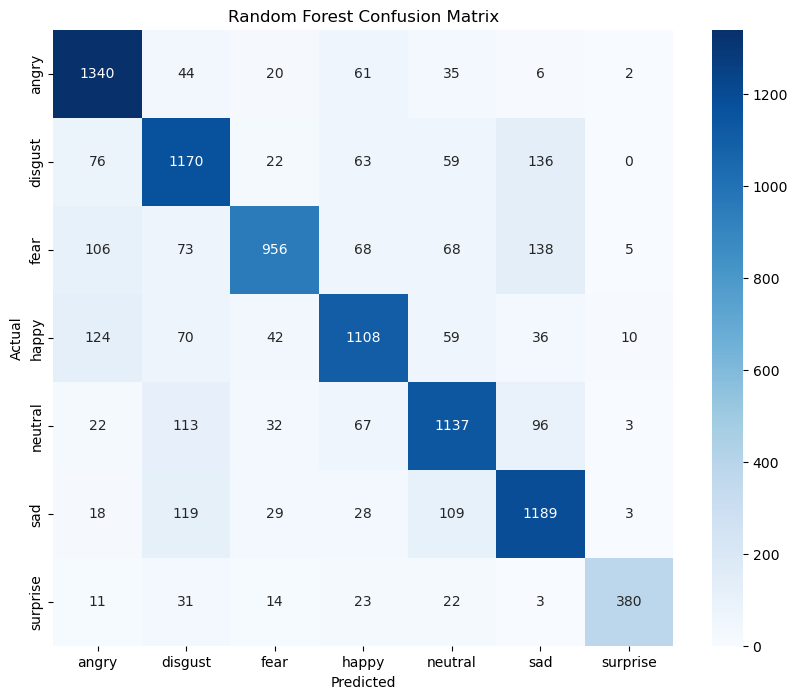

In [94]:
# Confusion matrix
cm_rf = confusion_matrix(np.argmax(y_test, axis=1), y_pred_rf)

# Convert confusion matrix to DataFrame for better visualization
cm_df_rf = pd.DataFrame(cm_rf, index=lb.classes_, columns=lb.classes_)

# Plotting the confusion matrix using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cm_df_rf, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Random Forest Confusion Matrix')
plt.show()

> **AUC ROC**

In [95]:
y_pred_prob_rf = rf_model.predict_proba(X_test)

y_test_binarized = label_binarize(np.argmax(y_test, axis=1), classes=range(len(lb.classes_)))

fpr_rf = dict()
tpr_rf = dict()
roc_auc_rf = dict()
n_classes = len(lb.classes_)

for i in range(n_classes):
    fpr_rf[i], tpr_rf[i], _ = roc_curve(y_test_binarized[:, i], y_pred_prob_rf[:, i])
    roc_auc_rf[i] = auc(fpr_rf[i], tpr_rf[i])

roc_traces_rf = []
for i in range(n_classes):
    trace = go.Scatter(
        x=fpr_rf[i],
        y=tpr_rf[i],
        mode='lines',
        name=f'{lb.classes_[i]} (AUC = {roc_auc_rf[i]:.2f})',
        line=dict(width=2)
    )
    roc_traces_rf.append(trace)

trace_diagonal_rf = go.Scatter(
    x=[0, 1],
    y=[0, 1],
    mode='lines',
    name='Random Classifier',
    line=dict(color='black', dash='dash')
)

layout_roc_rf = go.Layout(
    title='Random Forest: ROC Curves for Multiclass Classification',
    xaxis=dict(title='False Positive Rate'),
    yaxis=dict(title='True Positive Rate'),
    showlegend=True,
    legend=dict(
        x=0.95,
        y=0.05,
        xanchor='right',
        yanchor='bottom',
        bgcolor='rgba(255, 255, 255, 0.5)'
    ),
    width=800,
    height=600
)

fig_roc_rf = go.Figure(data=roc_traces_rf + [trace_diagonal_rf], layout=layout_roc_rf)

fig_roc_rf.show()

---

# KNN

In [96]:
from sklearn.neighbors import KNeighborsClassifier

In [97]:
# Initialize the KNN model
knn_model = KNeighborsClassifier(n_neighbors=5) 

In [98]:
# Train the KNN model
knn_model.fit(X_train, np.argmax(y_train, axis=1))

KNeighborsClassifier()

In [99]:
# Predict on the test set
y_pred_knn = knn_model.predict(X_test)

> **Scores**

In [100]:
y_pred_train_knn = knn_model.predict(X_train)
y_pred_val_knn = knn_model.predict(X_val)

# Accuracy scores
train_accuracy_knn = accuracy_score(np.argmax(y_train, axis=1), y_pred_train_knn)
val_accuracy_knn = accuracy_score(np.argmax(y_val, axis=1), y_pred_val_knn)
test_accuracy_knn = accuracy_score(np.argmax(y_test, axis=1), y_pred_knn)

print(f'KNN Train Accuracy: {train_accuracy_knn:.4f}')
print(f'KNN Validation Accuracy: {val_accuracy_knn:.4f}')
print(f'KNN Test Accuracy: {test_accuracy_knn:.4f}')

KNN Train Accuracy: 0.7860
KNN Validation Accuracy: 0.5983
KNN Test Accuracy: 0.5929


> **Classification Report**

In [101]:
# Classification report
report_knn = classification_report(np.argmax(y_test, axis=1), y_pred_knn, target_names=lb.classes_)
print(report_knn)

              precision    recall  f1-score   support

       angry       0.69      0.66      0.67      1508
     disgust       0.59      0.58      0.58      1526
        fear       0.49      0.55      0.52      1414
       happy       0.56      0.51      0.53      1449
     neutral       0.61      0.62      0.61      1470
         sad       0.58      0.65      0.61      1495
    surprise       0.79      0.58      0.67       484

    accuracy                           0.59      9346
   macro avg       0.62      0.59      0.60      9346
weighted avg       0.60      0.59      0.59      9346



> **Actual vs. Predicted**

In [102]:
import plotly.graph_objs as go

actual_counts_knn = np.bincount(np.argmax(y_test, axis=1), minlength=len(lb.classes_))
predicted_counts_knn = np.bincount(y_pred_knn, minlength=len(lb.classes_))

emotion_counts_df_knn = pd.DataFrame({
    'Emotion': lb.classes_,
    'Actual': actual_counts_knn,
    'Predicted': predicted_counts_knn
})

trace_actual_knn = go.Bar(
    x=emotion_counts_df_knn['Emotion'],
    y=emotion_counts_df_knn['Actual'],
    name='Actual',
    marker=dict(color='lightblue')
)

trace_predicted_knn = go.Bar(
    x=emotion_counts_df_knn['Emotion'],
    y=emotion_counts_df_knn['Predicted'],
    name='Predicted',
    marker=dict(color='darkblue')
)

layout_knn = go.Layout(
    title='KNN: Actual vs Predicted Emotion Counts',
    xaxis=dict(title='Emotion'),
    yaxis=dict(title='Count'),
    barmode='group'
)

fig_knn = go.Figure(data=[trace_actual_knn, trace_predicted_knn], layout=layout_knn)

fig_knn.show()

> **Confusion Matrix**

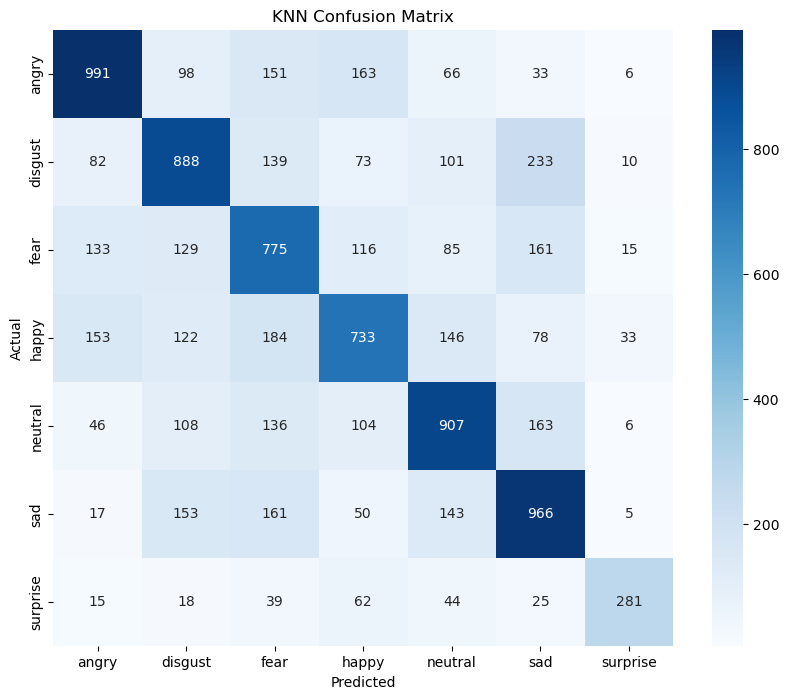

In [103]:
# Confusion matrix
cm_knn = confusion_matrix(np.argmax(y_test, axis=1), y_pred_knn)

cm_df_knn = pd.DataFrame(cm_knn, index=lb.classes_, columns=lb.classes_)

plt.figure(figsize=(10, 8))
sns.heatmap(cm_df_knn, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('KNN Confusion Matrix')
plt.show()

> **AUC ROC**

In [104]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

y_pred_prob_knn = knn_model.predict_proba(X_test)

y_test_binarized = label_binarize(np.argmax(y_test, axis=1), classes=range(len(lb.classes_)))

fpr_knn = dict()
tpr_knn = dict()
roc_auc_knn = dict()
n_classes = len(lb.classes_)

for i in range(n_classes):
    fpr_knn[i], tpr_knn[i], _ = roc_curve(y_test_binarized[:, i], y_pred_prob_knn[:, i])
    roc_auc_knn[i] = auc(fpr_knn[i], tpr_knn[i])

roc_traces_knn = []
for i in range(n_classes):
    trace = go.Scatter(
        x=fpr_knn[i],
        y=tpr_knn[i],
        mode='lines',
        name=f'{lb.classes_[i]} (AUC = {roc_auc_knn[i]:.2f})',
        line=dict(width=2)
    )
    roc_traces_knn.append(trace)

trace_diagonal_knn = go.Scatter(
    x=[0, 1],
    y=[0, 1],
    mode='lines',
    name='Random Classifier',
    line=dict(color='black', dash='dash')
)

layout_roc_knn = go.Layout(
    title='KNN: ROC Curves for Multiclass Classification',
    xaxis=dict(title='False Positive Rate'),
    yaxis=dict(title='True Positive Rate'),
    showlegend=True,
    legend=dict(
        x=0.95,
        y=0.05,
        xanchor='right',
        yanchor='bottom',
        bgcolor='rgba(255, 255, 255, 0.5)'
    ),
    width=800,
    height=600
)

fig_roc_knn = go.Figure(data=roc_traces_knn + [trace_diagonal_knn], layout=layout_roc_knn)

fig_roc_knn.show()